### Necessary Libraries and Frameworks

In [ ]:
pip install optuna

In [ ]:
import os
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from sklearn.model_selection import train_test_split
import torchvision.transforms as transforms
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

### Hyperparameters

In [ ]:
NUM_EPOCHS = 120
IMAGE_SIZE = (384, 512)
MEAN = [0.7059, 0.7097, 0.7028]
STD = [0.229, 0.224, 0.225]
THRESHOLD = 0.6

### Direcotories

In [ ]:
IMAGE_DIR = '/content/drive/My Drive/Mikroplastikai/S_2021_01'
MASK_DIR = '/content/drive/My Drive/Mikroplastikai/masks'
MODEL_PATH = 'microplastic_segmentation_model.pth'

### Microplastics Dataset

In [ ]:
class MicroplasticsDataset(Dataset):
    def __init__(self, image_paths, mask_paths, image_transforms=None, mask_transforms=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.image_transforms = image_transforms
        self.mask_transforms = mask_transforms

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        mask = Image.open(self.mask_paths[idx])

        if self.image_transforms:
            image = self.image_transforms(image)

        if self.mask_transforms:
            mask = self.mask_transforms(mask)

        return image, mask

### Train and test datasets and data loader

In [ ]:
def get_data_loaders_and_datasets(train_images, test_images, train_masks, test_masks, batch_size):
    # Data transformations
    image_transform = transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=MEAN, std=STD)
    ])

    mask_transform = transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor()
    ])

    # datasets
    train_dataset = MicroplasticsDataset(train_images, train_masks, image_transforms=image_transform, mask_transforms=mask_transform)
    test_dataset = MicroplasticsDataset(test_images, test_masks, image_transforms=image_transform, mask_transforms=mask_transform)

    # loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, test_loader, train_dataset, test_dataset

### U-Net Model

In [ ]:
# The convolutional block
def conv_block(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
        nn.ReLU(inplace=True)
    )

# The UNet model
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        self.down_conv_1 = conv_block(3, 64)
        self.down_conv_2 = conv_block(64, 128)
        self.down_conv_3 = conv_block(128, 256)
        self.down_conv_4 = conv_block(256, 512)
        self.down_conv_5 = conv_block(512, 1024)

        self.up_trans_1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up_conv_1 = conv_block(1024, 512)

        self.up_trans_2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up_conv_2 = conv_block(512, 256)

        self.up_trans_3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up_conv_3 = conv_block(256, 128)

        self.up_trans_4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up_conv_4 = conv_block(128, 64)

        self.out = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, image):
        # Downscaling part
        x1 = self.down_conv_1(image)
        x2 = self.down_conv_2(nn.MaxPool2d(kernel_size=2, stride=2)(x1))
        x3 = self.down_conv_3(nn.MaxPool2d(kernel_size=2, stride=2)(x2))
        x4 = self.down_conv_4(nn.MaxPool2d(kernel_size=2, stride=2)(x3))
        x5 = self.down_conv_5(nn.MaxPool2d(kernel_size=2, stride=2)(x4))

        # Upscaling part and skip connections
        x = self.up_trans_1(x5)
        x = self.up_conv_1(torch.cat([x, x4], 1))

        x = self.up_trans_2(x)
        x = self.up_conv_2(torch.cat([x, x3], 1))

        x = self.up_trans_3(x)
        x = self.up_conv_3(torch.cat([x, x2], 1))

        x = self.up_trans_4(x)
        x = self.up_conv_4(torch.cat([x, x1], 1))

        x = self.out(x)
        return x

model = UNet()

### Optuna objective function

In [ ]:
def objective(trial):
    batch_size = trial.suggest_categorical('batch_size', [4, 6, 8, 12, 16])
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])

    model = UNet().to(device)

    if optimizer_name == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    elif optimizer_name == 'RMSprop':
        optimizer = optim.RMSprop(model.parameters(), lr=learning_rate)
    else:
        optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

    criterion = nn.BCEWithLogitsLoss()

    train_loader, test_loader, _, _ = get_data_loaders_and_datasets(
        train_images, test_images, train_masks, test_masks, batch_size)

    for epoch in range(3):  # Shorter epochs for tuning
        model.train()
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

    # Evaluation phase
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)
            total_loss += loss.item()

    return total_loss / len(test_loader)

### Hyperparameter fine-tuning

In [ ]:
# Prepare dataset
images = [os.path.join(IMAGE_DIR, x) for x in sorted(os.listdir(IMAGE_DIR))]
masks = [os.path.join(MASK_DIR, x) for x in sorted(os.listdir(MASK_DIR))]
train_images, test_images, train_masks, test_masks = train_test_split(images, masks, test_size=0.2, random_state=42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Create a study object and perform optimization
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=15)

print("Best hyperparameters:", study.best_trial.params)

# Plot the optimization history
fig = optuna.visualization.plot_optimization_history(study)
fig.show()

# Plot individual hyperparameters' effects on the outcomes
fig = optuna.visualization.plot_slice(study)
fig.show()

# Plot the contour of hyperparameters vs. objective value
fig = optuna.visualization.plot_contour(study, params=['batch_size', 'learning_rate', 'optimizer'])
fig.show()

# Parallel coordinate plot of the hyperparameters
fig = optuna.visualization.plot_parallel_coordinate(study)
fig.show()

[I 2024-05-17 17:13:28,946] A new study created in memory with name: no-name-da9167de-dad9-4750-b957-62fef37afd83
[I 2024-05-17 17:15:00,527] Trial 0 finished with value: 0.007382123015954026 and parameters: {'batch_size': 6, 'learning_rate': 0.00018927416297465956, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 0.007382123015954026.
[I 2024-05-17 17:16:30,209] Trial 1 finished with value: 0.016931196741227592 and parameters: {'batch_size': 6, 'learning_rate': 0.005525305614844929, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.007382123015954026.
[I 2024-05-17 17:17:59,537] Trial 2 finished with value: 0.007356197573244572 and parameters: {'batch_size': 12, 'learning_rate': 0.0006385515849650079, 'optimizer': 'Adam'}. Best is trial 2 with value: 0.007356197573244572.
[I 2024-05-17 17:19:26,102] Trial 3 finished with value: 0.026383003619100367 and parameters: {'batch_size': 12, 'learning_rate': 0.007681131230490071, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.00735619

Best hyperparameters: {'batch_size': 4, 'learning_rate': 0.0008946656206255405, 'optimizer': 'Adam'}


### Training the Model

Epoch 1, Validation Loss: 0.018169394029038295
Validation loss decreased (0.018169 --> 0.018169).  Saving model ...
Epoch 2, Validation Loss: 0.01106999879924669
Validation loss decreased (0.011070 --> 0.011070).  Saving model ...
Epoch 3, Validation Loss: 0.005762733147656988
Validation loss decreased (0.005763 --> 0.005763).  Saving model ...
Epoch 4, Validation Loss: 0.006213144820538305
Validation loss did not improve from 0.005763
Epoch 5, Validation Loss: 0.004424811152386523
Validation loss decreased (0.004425 --> 0.004425).  Saving model ...
Epoch 6, Validation Loss: 0.0037591790896840394
Validation loss decreased (0.003759 --> 0.003759).  Saving model ...
Epoch 7, Validation Loss: 0.0035315508776832196
Validation loss decreased (0.003532 --> 0.003532).  Saving model ...
Epoch 8, Validation Loss: 0.024982426625986893
Validation loss did not improve from 0.003532
Epoch 9, Validation Loss: 0.004912687620768945
Validation loss did not improve from 0.003532
Epoch 10, Validation Los

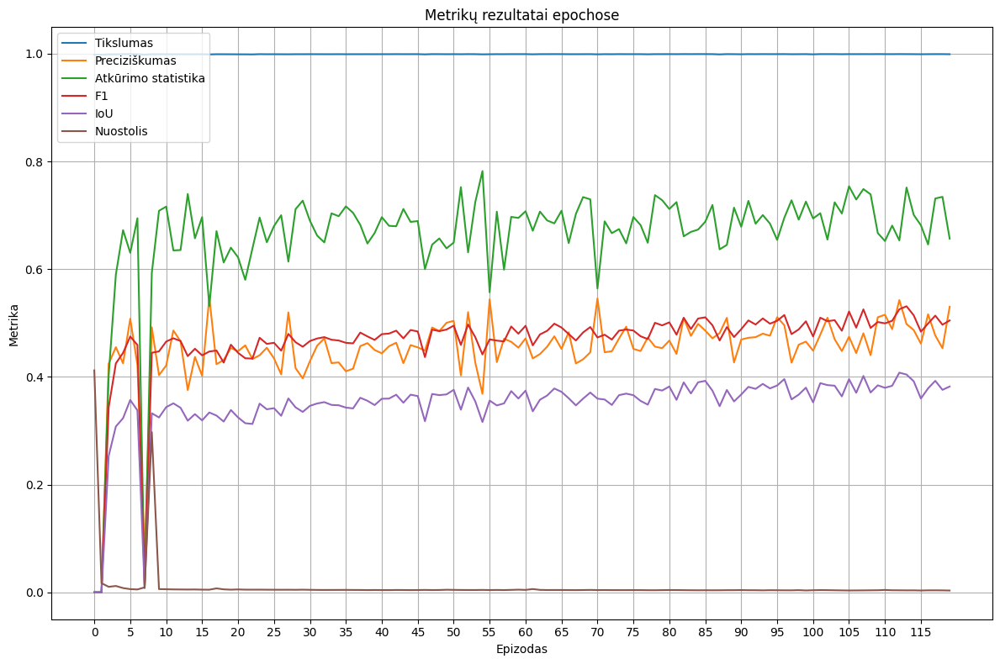

Epoch accuracies: [0.9980401561093428, 0.9980401561093428, 0.9987391091177983, 0.998739171911169, 0.9989715701758617, 0.9991360260135351, 0.9989929199218748, 0.9981359159995498, 0.9989866405848123, 0.9988822152094585, 0.9989360291280864, 0.9988550256799769, 0.9988915086283116, 0.9988247592753343, 0.998888871306745, 0.9989126072008424, 0.9985935540846836, 0.9989400479038065, 0.9989213982727302, 0.9988650726192772, 0.9987630333920076, 0.9987417464393648, 0.9985874003343621, 0.9990695278340407, 0.9989230936937371, 0.9989494669094007, 0.9988978507587448, 0.9988444136003408, 0.9989892151130079, 0.9989630302774564, 0.9990402661233283, 0.9990054158026298, 0.9989727632499037, 0.9989463272408694, 0.999035054273566, 0.9989286195103524, 0.9989914128809799, 0.9989843800234697, 0.9990358705873843, 0.9989612720630785, 0.9990346147199718, 0.9990050390424061, 0.9991078317901234, 0.9990317890182936, 0.9990640648107961, 0.999075555997621, 0.9986921396765689, 0.9991225254388503, 0.9990842842761383, 0.998

In [ ]:
# Train the model with the best hyperparameters
best_params = study.best_trial.params
model = UNet().to(device)

if best_params['optimizer'] == 'Adam':
    optimizer = optim.Adam(model.parameters(), lr=best_params['learning_rate'])
elif best_params['optimizer'] == 'RMSprop':
    optimizer = optim.RMSprop(model.parameters(), lr=best_params['learning_rate'])
else:
    optimizer = optim.SGD(model.parameters(), lr=best_params['learning_rate'], momentum=0.9)

criterion = nn.BCEWithLogitsLoss()
train_loader, test_loader, train_dataset, test_dataset = get_data_loaders_and_datasets(
    train_images, test_images, train_masks, test_masks, best_params['batch_size'])

epoch_accuracy = []
epoch_precision = []
epoch_recall = []
epoch_f1 = []
epoch_iou = []
epoch_losses = []

best_score = float('inf')
epochs_without_improvement = 0
patience = 50
last_epoch = 0

for epoch in range(NUM_EPOCHS):
    last_epoch = epoch
    model.train()
    total_loss = 0
    num_batches = 0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        num_batches += 1

    average_loss = total_loss / num_batches
    epoch_losses.append(average_loss)

    # Evaluation phase
    model.eval()
    accuracy_list = []
    precision_list = []
    recall_list = []
    f1_list = []
    iou_list = []

    validation_loss = 0

    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            predicted_probs = torch.sigmoid(outputs)
            predicted_mask = (predicted_probs > THRESHOLD).float()
            loss = criterion(outputs, masks)
            validation_loss += loss.item()

            for j in range(images.size(0)):
                mask_np = tensor_to_numpy_binary(masks[j])
                predicted_mask_np = tensor_to_numpy_binary(predicted_mask[j])

                mask_np_flat = mask_np.flatten()
                predicted_mask_np_flat = predicted_mask_np.flatten()

                accuracy_list.append(accuracy_score(mask_np_flat, predicted_mask_np_flat))
                precision_list.append(precision_score(mask_np_flat, predicted_mask_np_flat, zero_division=0))
                recall_list.append(recall_score(mask_np_flat, predicted_mask_np_flat, zero_division=0))
                f1_list.append(f1_score(mask_np_flat, predicted_mask_np_flat, zero_division=0))
                iou_list.append(calculate_iou(predicted_mask_np, mask_np))

    avg_validation_loss = validation_loss / len(test_loader)

    epoch_accuracy.append(np.mean(accuracy_list))
    epoch_precision.append(np.mean(precision_list))
    epoch_recall.append(np.mean(recall_list))
    epoch_f1.append(np.mean(f1_list))
    epoch_iou.append(np.mean(iou_list))

    print(f'Epoch {epoch+1}, Validation Loss: {avg_validation_loss}')

    # Early stopping logic
    if avg_validation_loss < best_score:
        best_score = avg_validation_loss
        torch.save(model.state_dict(), MODEL_PATH)
        epochs_without_improvement = 0
        print(f"Validation loss decreased ({best_score:.6f} --> {avg_validation_loss:.6f}).  Saving model ...")
    else:
        epochs_without_improvement += 1
        print(f"Validation loss did not improve from {best_score:.6f}")
        if epochs_without_improvement >= patience:
            print('Stopping training due to no improvement')
            break

model.load_state_dict(torch.load(MODEL_PATH))
epochs = range(0, len(epoch_accuracy))

plot_metrics(epochs, epoch_accuracy, epoch_precision, epoch_recall, epoch_f1, epoch_iou, epoch_losses)

print(f'Epoch accuracies: {epoch_accuracy}')
print(f'Epoch precisions: {epoch_precision}')
print(f'Epoch recalls: {epoch_recall}')
print(f'Epoch F1 Scores: {epoch_f1}')
print(f'Epoch IoUs: {epoch_iou}')
print(f'Epoch losses: {epoch_losses}')

In [ ]:
print(accuracy_list)
print(precision_list)
print(recall_list)
print(f1_list)
print(iou_list)

[0.9991861979166666, 0.998565673828125, 0.9999135335286459, 0.9998016357421875, 0.995147705078125, 0.9991912841796875, 0.9983723958333334, 0.9989420572916666, 0.9998372395833334, 0.9999186197916666, 0.9998728434244791, 0.9988810221354166, 0.9983723958333334, 0.9999186197916666, 0.9992624918619791, 0.9997914632161459, 0.9998219807942709, 0.9983571370442709, 0.9999033610026041, 0.999908447265625, 0.9997711181640625, 0.9997609456380209, 0.9997711181640625, 0.9979451497395834, 0.999725341796875, 0.9993387858072916, 0.9994405110677084, 0.9998779296875, 0.9998881022135416, 0.9997812906901041, 0.99859619140625, 0.9979400634765625, 0.999542236328125, 0.9991912841796875, 0.9997660319010416, 0.9998423258463541, 0.9997049967447916, 0.9999186197916666, 0.9977366129557291, 0.99969482421875, 0.9998779296875, 0.9998779296875, 0.9998524983723959, 0.999542236328125, 0.9991556803385416, 0.9993540445963541, 0.9998575846354166, 0.9998779296875, 0.9995981852213541, 0.9997609456380209, 0.9975229899088541, 0

### Evaluation and Visualization

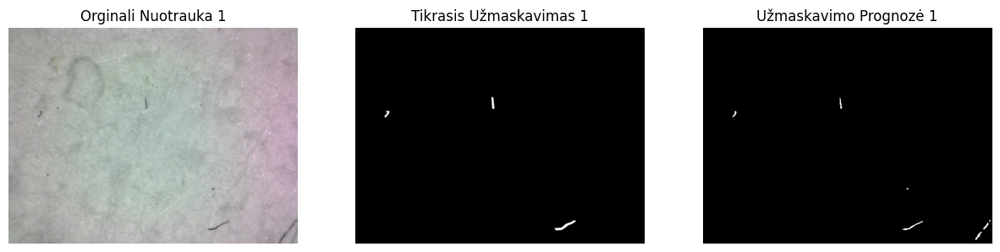

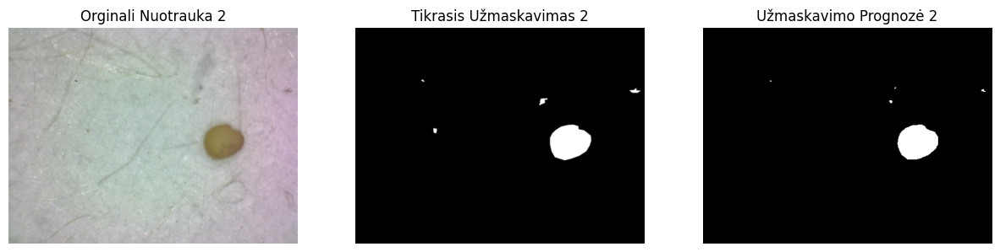

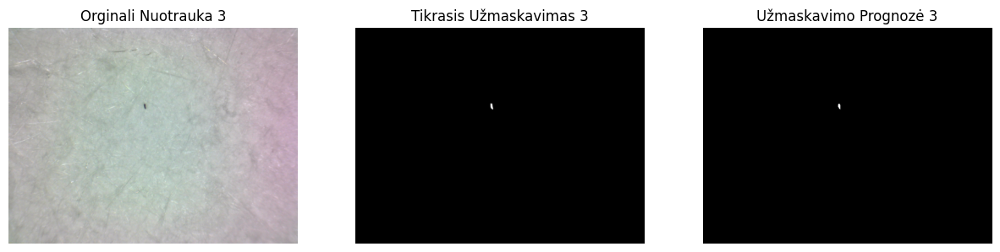

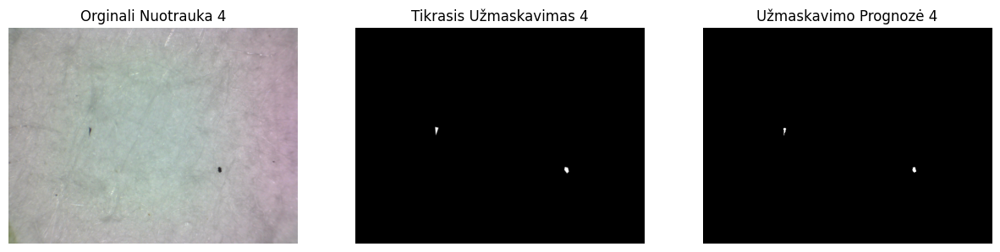

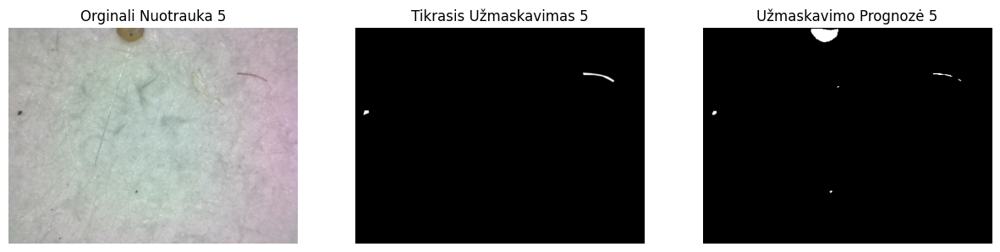

...

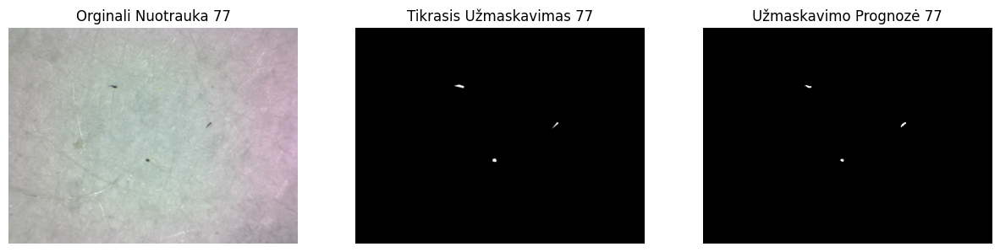

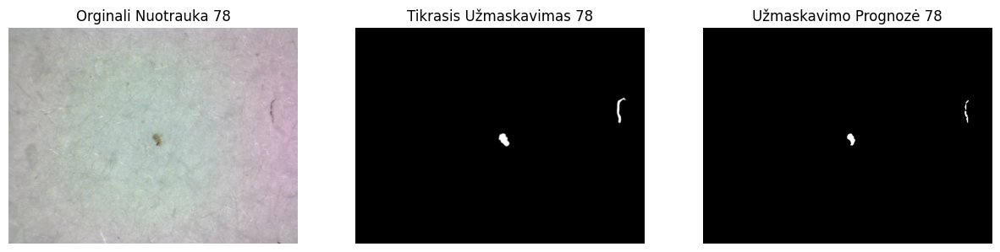

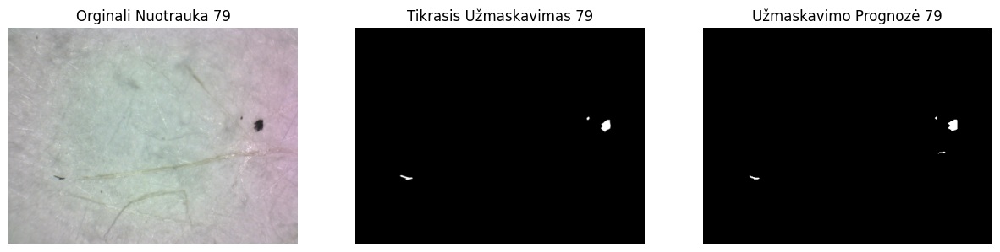

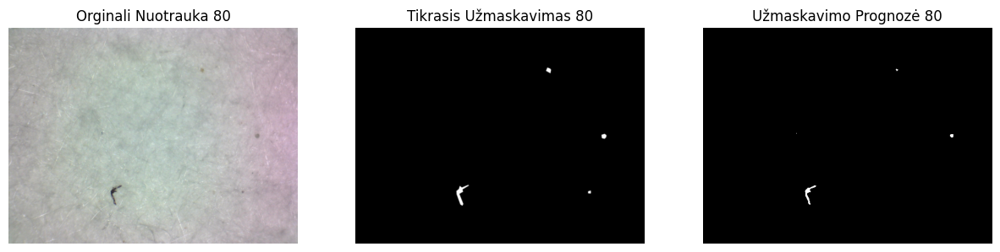

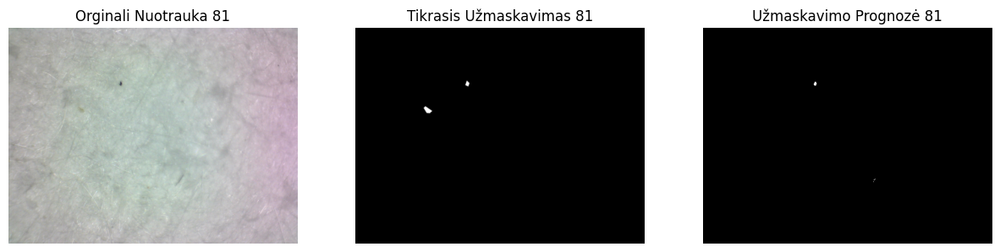

Average Accuracy: 0.9991
Average Precision: 0.4980
Average Recall: 0.7515
Average F1 Score: 0.5311
Average IoU: 0.4043


In [ ]:
# Initialize lists to store metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []
iou_list = []

# Evaluate the model and visualize the results
model.eval()
with torch.no_grad():
    image_counter = 0

    for i, (images, masks) in enumerate(test_loader):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)

        for j in range(images.size(0)):
            image_counter += 1

            # Apply sigmoid to get probabilities and then threshold to get binary output
            predicted_probs = torch.sigmoid(outputs[j])
            predicted_mask = (predicted_probs > THRESHOLD).float()

            # Convert the tensors to binary format for metric calculation
            mask_np = tensor_to_numpy_binary(masks[j])
            predicted_mask_np = tensor_to_numpy_binary(predicted_mask)

            # Flatten the arrays for metric calculations
            mask_np_flat = mask_np.flatten()
            predicted_mask_np_flat = predicted_mask_np.flatten()

            # Calculate metrics for each image and append to the lists
            accuracy_list.append(accuracy_score(mask_np_flat, predicted_mask_np_flat))
            precision_list.append(precision_score(mask_np_flat, predicted_mask_np_flat, zero_division=0))
            recall_list.append(recall_score(mask_np_flat, predicted_mask_np_flat, zero_division=0))
            f1_list.append(f1_score(mask_np_flat, predicted_mask_np_flat, zero_division=0))

            iou_score = calculate_iou(predicted_mask_np, mask_np)
            iou_list.append(iou_score)

            # Visualization - Display the first set of original, normalized, mask, and predicted mask images
            plt.figure(figsize=(15, 5))

            # Original Image (without normalization)
            original_image_path = test_dataset.image_paths[i * test_loader.batch_size + j]
            original_image = Image.open(original_image_path)
            plt.subplot(1, 3, 1)
            plt.imshow(original_image)
            plt.title(f'Orginali Nuotrauka {image_counter}')
            plt.axis('off')

            # Ground Truth Mask
            plt.subplot(1, 3, 2)
            plt.imshow(masks[j].cpu().squeeze(), cmap='gray')
            plt.title(f'Tikrasis Užmaskavimas {image_counter}')
            plt.axis('off')

            # Predicted Mask
            plt.subplot(1, 3, 3)
            plt.imshow(predicted_mask.cpu().squeeze(), cmap='gray')
            plt.title(f'Užmaskavimo Prognozė {image_counter}')
            plt.axis('off')

            plt.show()

# Calculate and print average metrics
avg_accuracy = np.mean(accuracy_list)
avg_precision = np.mean(precision_list)
avg_recall = np.mean(recall_list)
avg_f1 = np.mean(f1_list)
avg_iou = np.mean(iou_list)

print(f'Average Accuracy: {avg_accuracy:.4f}')
print(f'Average Precision: {avg_precision:.4f}')
print(f'Average Recall: {avg_recall:.4f}')
print(f'Average F1 Score: {avg_f1:.4f}')
print(f'Average IoU: {avg_iou:.4f}')


In [ ]:
# save the model
torch.save(model.state_dict(), 'microplastic_segmentation_model.pth')

### Additional plots

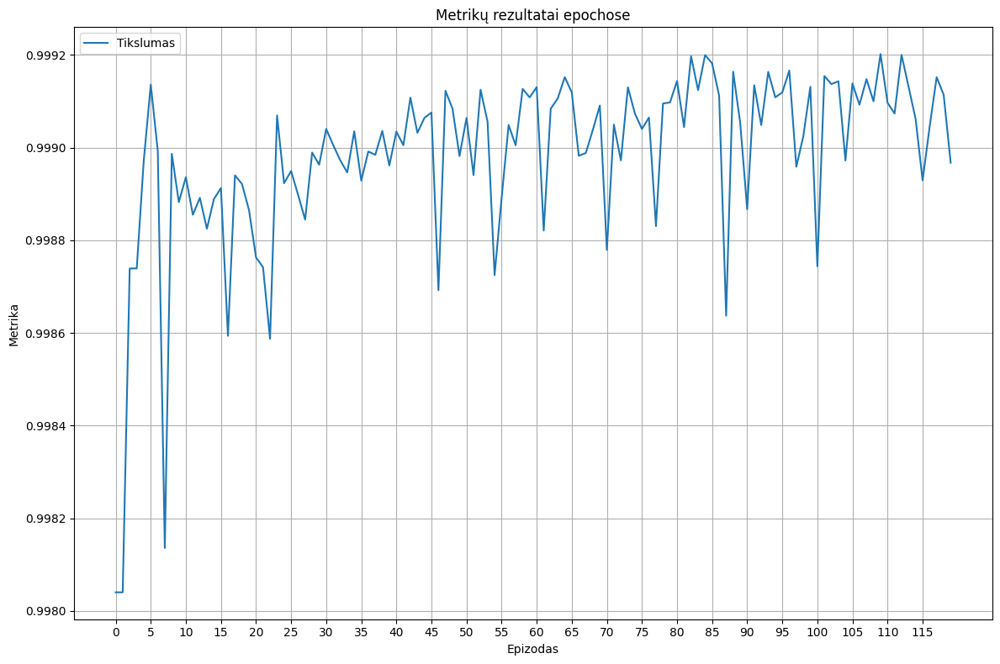

In [ ]:
plot_metrics(epochs, epoch_accuracy, None, None, None, None, None)

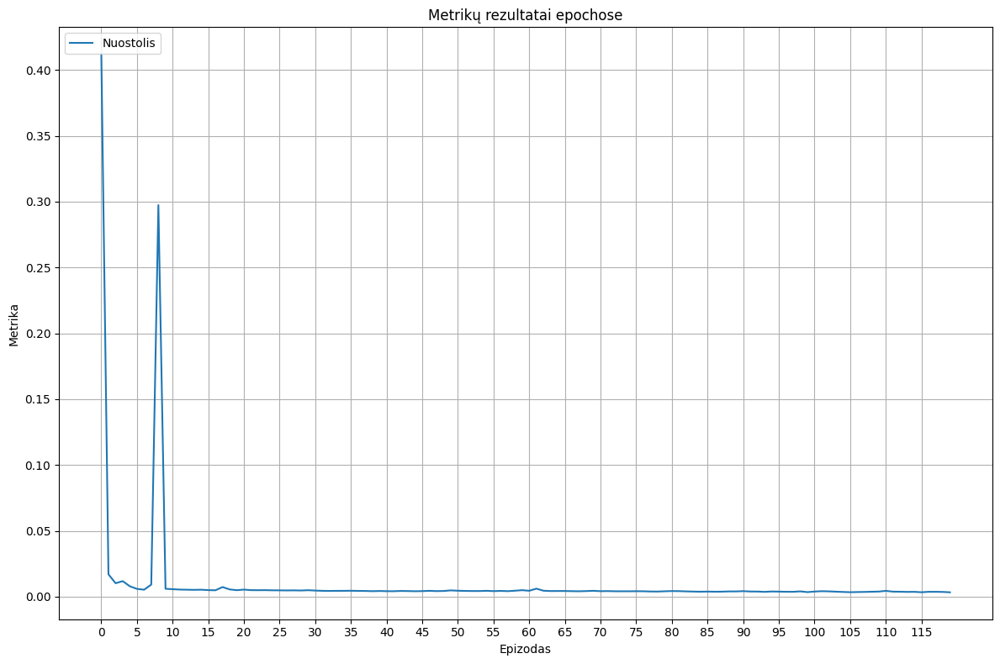

In [ ]:
plot_metrics(epochs, None, None, None, None, None, epoch_losses)

In [ ]:
# All metrics with 10 skipped epoch results
epochs_skipped = epochs[10:]
epoch_accuracy_skipped = epoch_accuracy[10:]
epoch_precision_skipped = epoch_precision[10:]
epoch_recall_skipped = epoch_recall[10:]
epoch_f1_skipped = epoch_f1[10:]
epoch_iou_skipped = epoch_iou[10:]
epoch_losses_skipped = epoch_losses[10:]

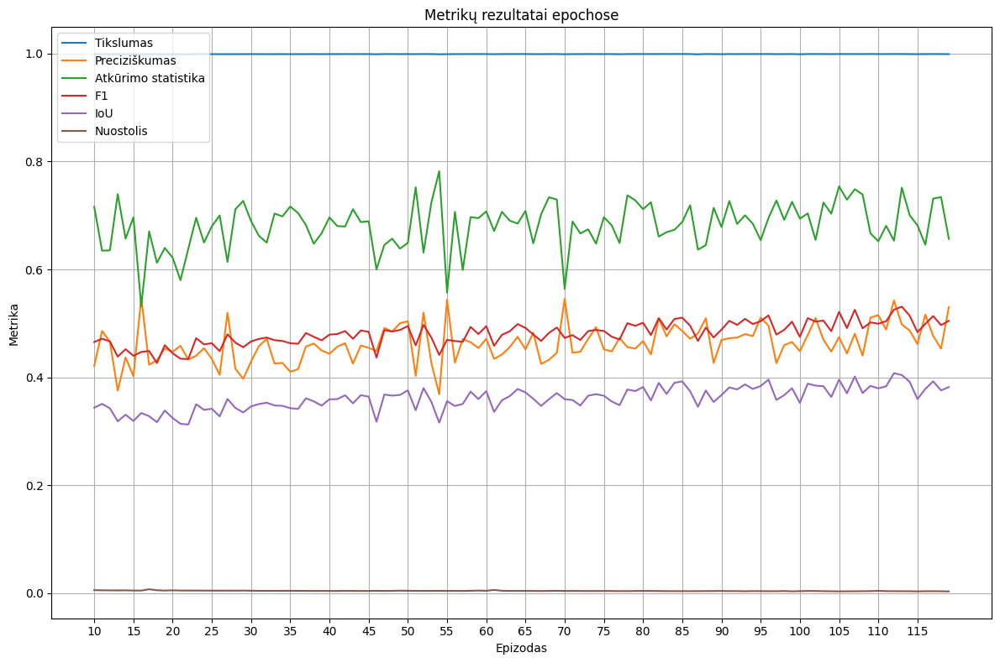

In [ ]:
plot_metrics_skipped(epochs_skipped, epoch_accuracy_skipped, epoch_precision_skipped, epoch_recall_skipped, epoch_f1_skipped, epoch_iou_skipped, epoch_losses_skipped)

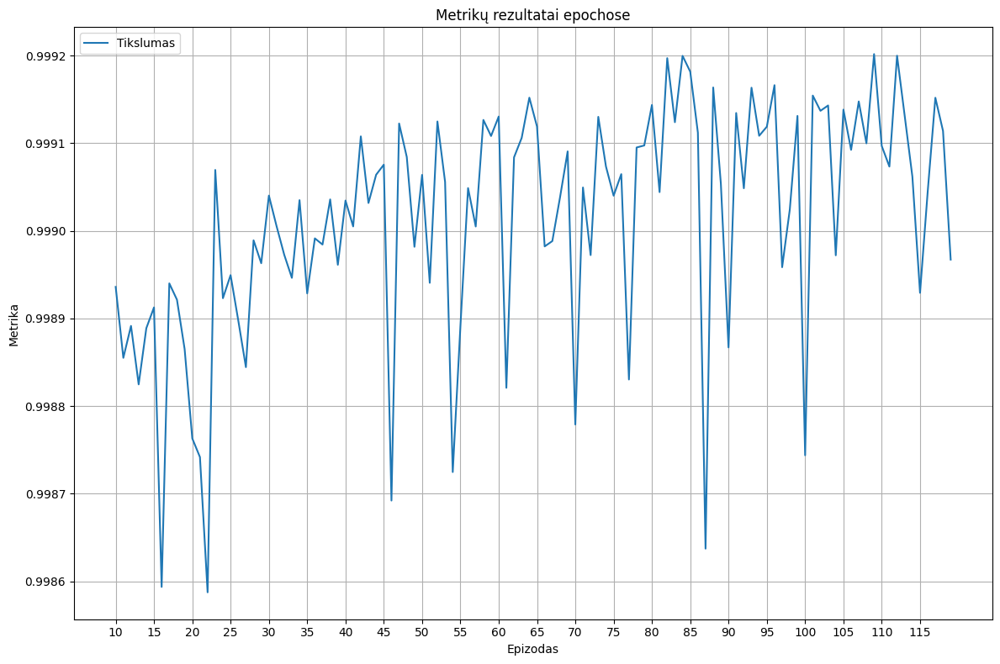

In [ ]:
plot_metrics_skipped(epochs_skipped, epoch_accuracy_skipped, None, None, None, None, None)

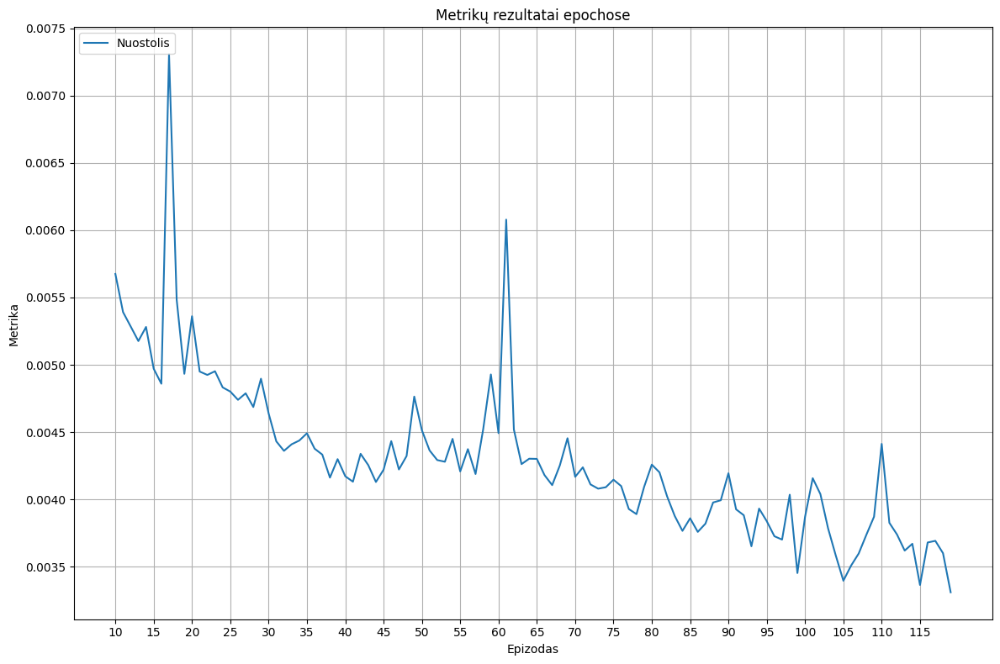

In [ ]:
plot_metrics_skipped(epochs_skipped, None, None, None, None, None, epoch_losses_skipped)

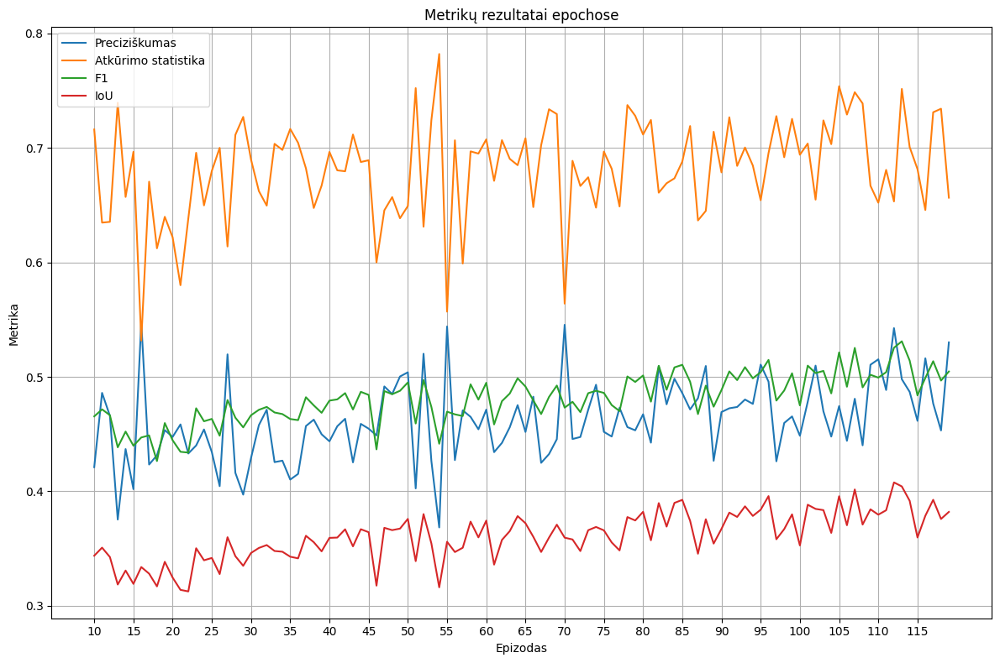

In [ ]:
plot_metrics_skipped(epochs_skipped, None, epoch_precision_skipped, epoch_recall_skipped, epoch_f1_skipped, epoch_iou_skipped, None)

### Calcualte mean and standard deviation

In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_paths = [os.path.join(image_dir, img) for img in os.listdir(image_dir) if img.endswith(('png', 'jpg', 'jpeg'))]
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

image_transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor()
])

dataset = CustomImageDataset(
    image_dir=IMAGE_DIR,
    transform=image_transform
)

loader = DataLoader(dataset, batch_size=10, shuffle=False, num_workers=1)

# Function to calculate mean and std
def calculate_mean_std(loader):
    mean = 0.
    std = 0.
    total_images_count = 0

    for images in loader:
        batch_samples = images.size(0)
        images = images.view(batch_samples, images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        total_images_count += batch_samples

    mean /= total_images_count
    std /= total_images_count

    return mean, std

mean, std = calculate_mean_std(loader)
print(f'Mean: {mean}')
print(f'Std: {std}')

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Mean: tensor([0.7059, 0.7097, 0.7028])
Std: tensor([0.0414, 0.0485, 0.0450])


### Utility functions

In [ ]:
def tensor_to_numpy_binary(tensor):
    return tensor.cpu().detach().numpy().astype(np.uint8)

In [ ]:
def calculate_iou(predicted, target):
    intersection = np.logical_and(target, predicted)
    union = np.logical_or(target, predicted)
    if np.sum(union) == 0:
        iou_score = 0.0
    else:
        iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

In [ ]:
def plot_metrics(epochs, accuracy, precision, recall, f1, iou, losses):
    plt.figure(figsize=(12, 8))

    # Metrics
    if (accuracy != None):
      plt.plot(epochs, accuracy, label='Tikslumas')
    if (precision != None):
      plt.plot(epochs, precision, label='Preciziškumas')
    if (recall != None):
      plt.plot(epochs, recall, label='Atkūrimo statistika')
    if (f1 != None):
      plt.plot(epochs, f1, label='F1')
    if (iou != None):
      plt.plot(epochs, iou, label='IoU')
    if (losses != None):
      plt.plot(epochs, losses, label='Nuostolis')

    plt.xlabel('Epizodas')
    plt.ylabel('Metrika')
    plt.title('Metrikų rezultatai epochose')
    plt.legend(loc='upper left')
    plt.xticks(np.arange(0, last_epoch + 1, 5))
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_metrics_skipped(epochs, accuracy, precision, recall, f1, iou, losses):
    plt.figure(figsize=(12, 8))

    if accuracy is not None:
        plt.plot(epochs, accuracy, label='Tikslumas')
    if precision is not None:
        plt.plot(epochs, precision, label='Preciziškumas')
    if recall is not None:
        plt.plot(epochs, recall, label='Atkūrimo statistika')
    if f1 is not None:
        plt.plot(epochs, f1, label='F1')
    if iou is not None:
        plt.plot(epochs, iou, label='IoU')
    if losses is not None:
        plt.plot(epochs, losses, label='Nuostolis')

    plt.xlabel('Epizodas')
    plt.ylabel('Metrika')
    plt.title('Metrikų rezultatai epochose')
    plt.legend(loc='upper left')
    plt.xticks(np.arange(10, last_epoch + 1, 5))
    plt.grid(True)

    plt.tight_layout()
    plt.show()